# Dry Bean Seeds Classification Model

## Contents:
* [Introduction](#0-bullet)
* [Imports all requirements](#first-bullet)
* [Load Data adn Cleaning](#second-bullet) 
* [Data Analysis](#third-bullet)
* [Normalise data](#fourth-bullet)
* [Training and data set](#5-bullet)
* [Gaussian Naive Bayes ](#6-bullet)
** [Tuning Hyper-parameters](#7-bullet)
** [Final Model](#8-bullet)
** [Evaluation](#9-bullet)
* [Support Vector Machine](#10-bullet)
** [Tuning Hyper-parameters](#11-bullet)
** [Final Model](#12-bullet)
** [Evaluation](#13-bullet)
* [Naive Bayes vs Support Vector Machine](#14-bullet)
* [K fold cross validation](#15-bullet)
** [GNB](#16-bullet)
** [SVM](#17-bullet)
** [GNB vs SVM](#18-bullet)
* [Automatic Results Output](#19-bullet)
* [Conclusions](#20-bullet)

# Introduction

The objective of this report is to present a dry bean seed classification model using machine learning techniques. Beans
are an important crop worldwide and bean classification is a crucial process that can affect their quality and value.
In this project, a bean seed dataset was used to train and evaluate the classification model. The model is based on
seed characteristics such as size, shape and texture, and machine learning algorithms were used to identify and classify
different bean seed varieties. The results of the model will be presented and discussed in this report, as well as its
potential applications.

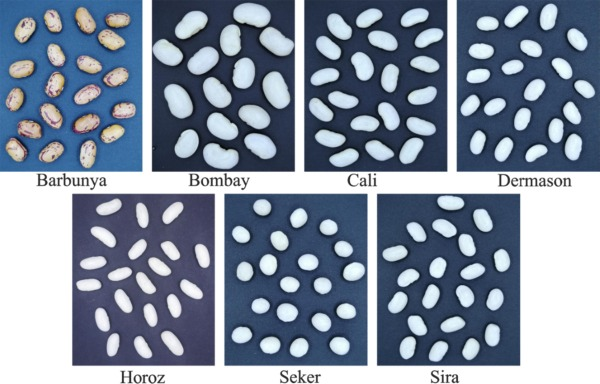

# Imports all requirements <a class="anchor" id="first-bullet"></a>

In [8]:
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,accuracy_score
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


# Load Data and Cleaning <a class="anchor" id="second-bullet"></a>

In [39]:
# Load the Excel file into a Pandas DataFrame
df = pd.read_excel('Dry_Bean_Dataset.xlsx')

df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


In [121]:
df.count()

Area               13611
Perimeter          13611
MajorAxisLength    13611
MinorAxisLength    13611
AspectRation       13611
Eccentricity       13611
ConvexArea         13611
EquivDiameter      13611
Extent             13611
Solidity           13611
roundness          13611
Compactness        13611
ShapeFactor1       13611
ShapeFactor2       13611
ShapeFactor3       13611
ShapeFactor4       13611
Class              13611
dtype: int64

In [119]:
## checking if any null values exist in dataframe
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [126]:
# Identify duplicates
duplicates = df.duplicated()

# Count the total number of duplicate rows
num_duplicates = duplicates.sum()
print("Total number of duplicate rows:", num_duplicates)

Total number of duplicate rows: 68


In [127]:
# Remove duplicates from the DataFrame
df_without_duplicates = df.drop_duplicates()

# Data Analysis <a class="anchor" id="third-bullet"></a>

In [40]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


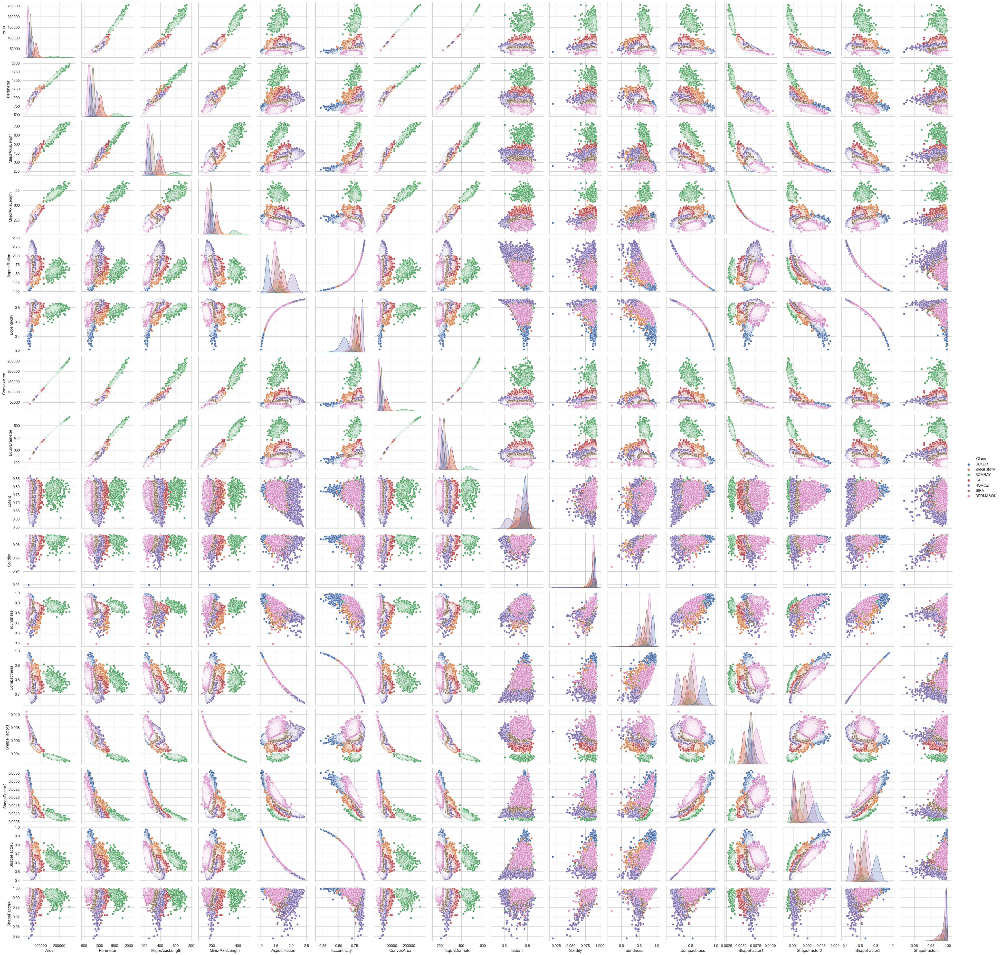

In [234]:
sns.pairplot(df, hue='Class')

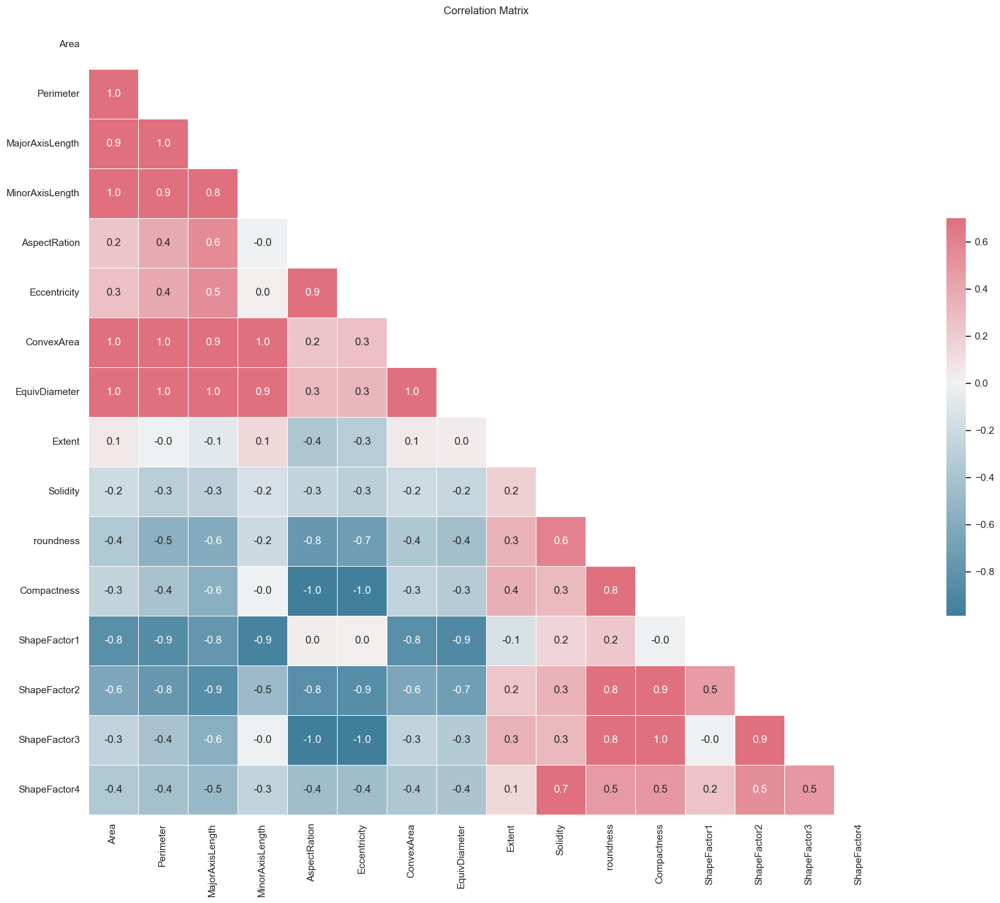

In [128]:
corr=df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(25, 16))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 8, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.7, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, 
            annot = True, fmt='.1f')
#sns.set(font_scale=1.5)
plt.title("Correlation Matrix")
plt.show()

The correlation matrix shows that all variables have a medium to high correlation with each other, except for Extent and Solidity which exhibit the lowest correlation values with the other variables. In any case, we will use all the features to train the model, since even though Solidity and Extent have a low correlation, there may be patterns inherent in these variables that are not explainable by correlation alone.

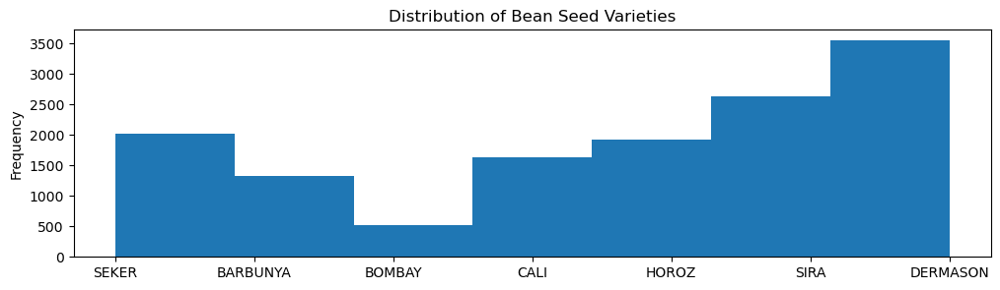

In [9]:
# Create histograma
plt.figure(figsize=(12, 3))
plt.hist(df['Class'], bins=7)

# add labels and title
#plt.xlabel('Classifications')
plt.ylabel('Frequency')
plt.title('Distribution of Bean Seed Varieties')

# Show Histogram
plt.show()

as can be seen in the
seed variety distribution graph, there is not a good amount of data for BOMBAY seed, which may lead to a bias of
that classification in the model.

# Normalise data <a class="anchor" id="4-bullet"></a>

In [41]:
# Normalise the data over a range of [0, 1].
scaler = MinMaxScaler()
df_norm = pd.DataFrame(scaler.fit_transform(df.drop(columns=['Class'])), columns=df.columns[:-1])

# Add column 'Class' 
df_norm['Class'] = df['Class']

In [42]:
# Converting non-numeric values to numeric values
le = LabelEncoder()
df_norm['Class'] = le.fit_transform(df_norm['Class'])

In [43]:
df_norm

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,0.034053,0.058574,0.044262,0.152142,0.122612,0.477797,0.033107,0.070804,0.671024,0.922824,0.934823,0.786733,0.593432,0.833049,0.750996,0.980620,5
1,0.035500,0.077557,0.030479,0.178337,0.051577,0.278472,0.034991,0.073577,0.735504,0.871514,0.793138,0.903549,0.547447,0.967315,0.884987,0.974979,5
2,0.038259,0.068035,0.052633,0.158190,0.131521,0.496448,0.037126,0.078816,0.716671,0.932141,0.914511,0.773514,0.582016,0.800942,0.736200,0.987196,5
3,0.040940,0.082942,0.048548,0.177691,0.091623,0.403864,0.041389,0.083854,0.731365,0.761614,0.826871,0.829912,0.552408,0.854744,0.799846,0.893675,5
4,0.041504,0.065313,0.032862,0.200679,0.025565,0.165680,0.040123,0.084906,0.700538,0.949832,0.988408,0.951583,0.510741,1.000000,0.941770,0.989116,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,0.092559,0.160862,0.189318,0.187843,0.375584,0.788553,0.089967,0.172180,0.512286,0.942381,0.852151,0.465175,0.531785,0.382135,0.412185,0.974113,3
13607,0.092576,0.159358,0.176450,0.201964,0.321303,0.746241,0.089910,0.172207,0.786890,0.947954,0.862952,0.523974,0.509582,0.426233,0.470848,0.970912,3
13608,0.092739,0.160605,0.176384,0.203370,0.318558,0.743877,0.090219,0.172463,0.561689,0.936648,0.855785,0.525351,0.508683,0.427019,0.472240,0.943025,3
13609,0.092773,0.163657,0.179703,0.200669,0.330472,0.753971,0.090623,0.172517,0.482741,0.908991,0.834795,0.510145,0.514216,0.415330,0.456919,0.913342,3


In [44]:
df_norm['Class'].unique()

array([5, 0, 1, 2, 4, 6, 3])

In [45]:
# Creates a dictionary that maps the numeric values of 'Class' to the original class names.
class_dict = dict(zip(le.transform(le.classes_), le.classes_))

In [46]:
class_dict

{0: 'BARBUNYA',
 1: 'BOMBAY',
 2: 'CALI',
 3: 'DERMASON',
 4: 'HOROZ',
 5: 'SEKER',
 6: 'SIRA'}

In [47]:
class_dict.values()

dict_values(['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'])

In [48]:
#Create a function to plot the confusion matrix for model evaluation

def plot_confusion_matrix(model,X_test,y_test,title='',is_ml=False, labels={}):
    
  ticks = list(map(lambda x : class_dict[x], np.unique(y_test).tolist())) if labels=={} else labels.values()
  preds = model.predict(X_test)
  pred_cat = preds if is_ml else np.argmax(preds,axis=1)
  print('model accuracy on test set is: {0:.2f}%'.format(accuracy_score(y_test,pred_cat)*100))
  plt.figure(figsize=(15,8),dpi=120)
  sns.heatmap(confusion_matrix(y_test,pred_cat),cmap='Blues',annot=True, fmt='d',xticklabels=ticks,yticklabels=ticks)
  plt.xlabel('Prediction')
  plt.ylabel('True label')
  plt.title(title)
  plt.show()

# Training and data set <a class="anchor" id="5-bullet"></a>

In [77]:
# Divide the DataFrame into two NumPy arrays
X = df_norm.drop(columns=['Class','ID']).to_numpy()
y = df_norm['Class'].to_numpy()

In [78]:
# Splitting data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Naive Bayes <a class="anchor" id="6-bullet"></a>

## Tuning Hyper-parameters  <a class="anchor" id="7-bullet"></a>


In [79]:
# Define the values of var_smoothing to be tested in the search
param_grid = {'var_smoothing': np.concatenate((np.logspace(0, -9, num=100), [0]))}

# Create GridSearchCV object
gnb = GaussianNB()
grid_search = GridSearchCV(gnb, param_grid, cv=10)

# Fitting the model with GridSearchCV
grid_search.fit(X_train, y_train)

# Selecting the best model
best_gnb = grid_search.best_estimator_

# Predicting test values with the best model
y_pred_gnb = best_gnb.predict(X_test)

print("Mejor valor de var_smoothing:", grid_search.best_params_['var_smoothing'])

# Evaluating model performance on test data
cm = classification_report(y_test, y_pred_gnb)
print(cm)

Mejor valor de var_smoothing: 0.0023101297000831605
              precision    recall  f1-score   support

           0       0.85      0.81      0.83       395
           1       1.00      1.00      1.00       161
           2       0.86      0.89      0.88       479
           3       0.93      0.86      0.90      1043
           4       0.96      0.96      0.96       588
           5       0.93      0.94      0.94       619
           6       0.82      0.89      0.86       799

    accuracy                           0.90      4084
   macro avg       0.91      0.91      0.91      4084
weighted avg       0.90      0.90      0.90      4084



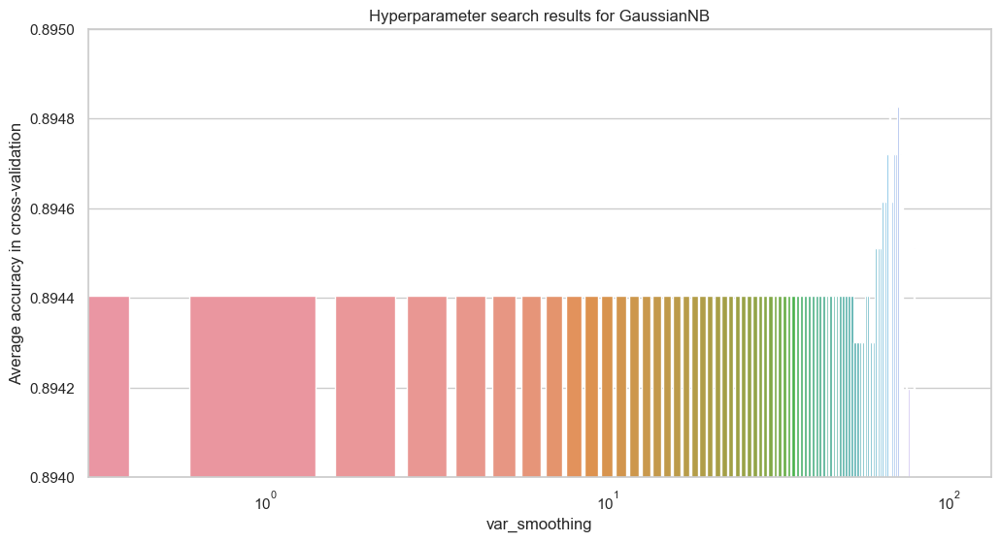

In [80]:
#  Create a DataFrame from the hyperparameter search results
results = pd.DataFrame(grid_search.cv_results_)
results = results[['param_var_smoothing', 'mean_test_score', 'std_test_score']]
results = results.rename(columns={'param_var_smoothing': 'var_smoothing'})

# Create the bar chart
sns.set(style='whitegrid')
plt.figure(figsize=(12, 6))
sns.barplot(x='var_smoothing', y='mean_test_score', data=results)
plt.title('Hyperparameter search results for GaussianNB')
plt.xlabel('var_smoothing')
plt.ylabel('Average accuracy in cross-validation')
plt.ylim(0.894,0.8950)
plt.xscale('log')
plt.show()

## Final model GNB <a class="anchor" id="8-bullet"></a>

In [81]:
gnb = GaussianNB(var_smoothing=0.0023101297000831605)
gnb.fit(X_train, y_train)

y_pred_gnb = gnb.predict(X_test)

## Evaluation <a class="anchor" id="9-bullet"></a>

In [82]:
# Suppose 'y_test' is your test dataset and 'y_pred_gnb' is your model prediction.

gnb_accuracy = accuracy_score(y_test, y_pred_gnb)
gnb_precision = precision_score(y_test, y_pred_gnb, average='weighted')
gnb_recall = recall_score(y_test, y_pred_gnb, average='weighted')
gnb_f1 = f1_score(y_test, y_pred_gnb, average='weighted')

# Displays the results
print("Accuracy: {:.2f}".format(gnb_accuracy))
print("Precision: {:.2f}".format(gnb_precision))
print("Recall: {:.2f}".format(gnb_recall))
print("F1-score: {:.2f}".format(gnb_f1))

Accuracy: 0.90
Precision: 0.90
Recall: 0.90
F1-score: 0.90


In [83]:
from sklearn.metrics import classification_report
cm=classification_report(y_test, y_pred_gnb)
print(cm)

              precision    recall  f1-score   support

           0       0.85      0.81      0.83       395
           1       1.00      1.00      1.00       161
           2       0.86      0.89      0.88       479
           3       0.93      0.86      0.90      1043
           4       0.96      0.96      0.96       588
           5       0.93      0.94      0.94       619
           6       0.82      0.89      0.86       799

    accuracy                           0.90      4084
   macro avg       0.91      0.91      0.91      4084
weighted avg       0.90      0.90      0.90      4084



model accuracy on test set is: 89.86%


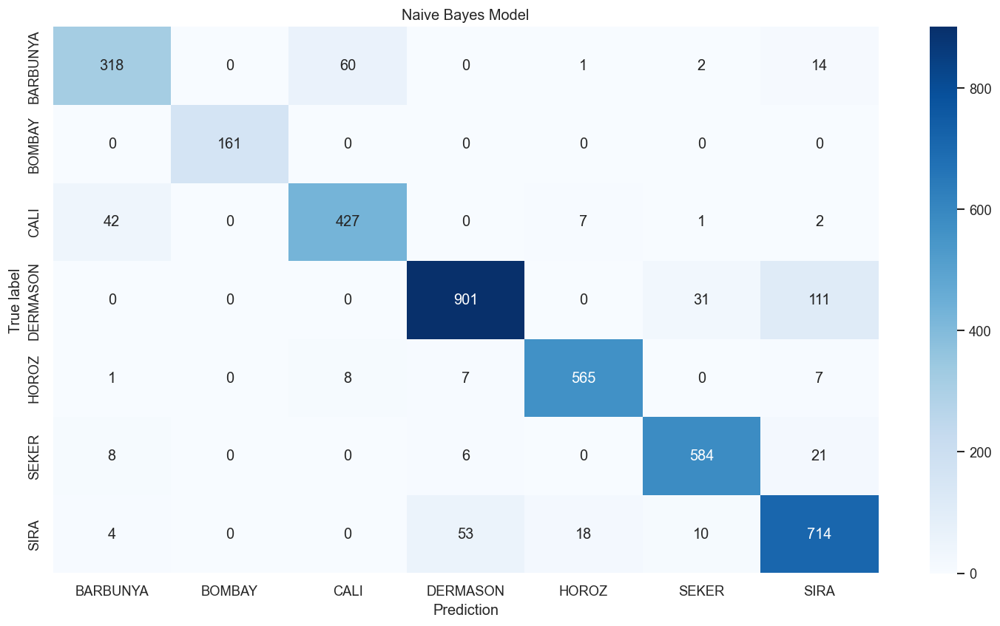

In [84]:
plot_confusion_matrix(gnb,X_test,y_test,"Naive Bayes Model",is_ml=True)

# Support Vector Machine <a class="anchor" id="10-bullet"></a>

## Tuning Hyper-parameters <a class="anchor" id="11-bullet"></a>

In [86]:
# Define the parameters to be tested
parameters = {'kernel': ['linear', 'rbf', 'poly'], 
              'C': [0.1, 1, 10], 
              'gamma': [0.1, 1, 10]}

# Create the SVM classifier
svm = SVC()

# Perform grid search with cross validation
grid_search = GridSearchCV(svm, parameters, cv=5)
grid_search.fit(X_train, y_train)

# To obtain the best parameters and the best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Training the SVM model with the best parameters
svm = SVC(**best_params)
svm.fit(X_train, y_train)

# Making predictions with the SVM model
y_pred_svm = svm.predict(X_test)

# Print the classification report
cm = classification_report(y_test, y_pred_svm)
print(cm)

              precision    recall  f1-score   support

           0       0.94      0.93      0.93       395
           1       1.00      1.00      1.00       161
           2       0.94      0.94      0.94       479
           3       0.91      0.93      0.92      1043
           4       0.97      0.95      0.96       588
           5       0.96      0.95      0.96       619
           6       0.89      0.88      0.88       799

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



In [89]:
print("Mejores parámetros:", grid_search.best_params_)

Mejores parámetros: {'C': 10, 'gamma': 10, 'kernel': 'rbf'}


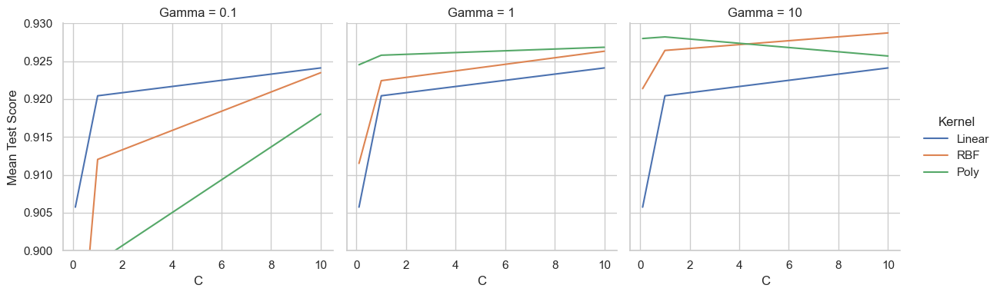

In [90]:
# Create a DataFrame from the results matrix
results = pd.DataFrame(grid_search.cv_results_)

# Select relevant columns
cols = ['param_kernel', 'param_C', 'param_gamma', 'mean_test_score']

# Add a column for the cross validation score
results['mean_test_score'] = grid_search.cv_results_['mean_test_score']

# Select only rows with cross-validation scores
results= results[results['mean_test_score'].notnull()]

# Create a Seaborn plot of the cross-validation score as a function of C
sns.set(style="whitegrid")
g = sns.relplot(x="param_C", y="mean_test_score", hue="param_kernel", col="param_gamma", data=results, kind="line", height=4, aspect=1)
g.set_ylabels("Mean Test Score")
g.set_xlabels("C")
g.set_titles("Gamma = {col_name}")
plt.ylim(0.9, 0.93)

# Add the legend to the chart
g._legend.set_title('Kernel')
new_labels = ['Linear', 'RBF', 'Poly']
for t, l in zip(g._legend.texts, new_labels): t.set_text(l)

# Show the graph
plt.show()

In [91]:
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.706521,0.005412,0.293062,0.003106,0.1,0.1,linear,"{'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'}",0.907660,0.909234,0.907612,0.902362,0.901837,0.905741,0.003034,22
1,1.676745,0.036908,1.289265,0.041040,0.1,0.1,rbf,"{'C': 0.1, 'gamma': 0.1, 'kernel': 'rbf'}",0.880902,0.873557,0.881890,0.880840,0.872441,0.877926,0.004055,26
2,2.333275,0.088749,0.560330,0.018944,0.1,0.1,poly,"{'C': 0.1, 'gamma': 0.1, 'kernel': 'poly'}",0.733998,0.736621,0.726509,0.733858,0.726509,0.731499,0.004192,27
3,0.772356,0.037430,0.309851,0.009323,0.1,1,linear,"{'C': 0.1, 'gamma': 1, 'kernel': 'linear'}",0.907660,0.909234,0.907612,0.902362,0.901837,0.905741,0.003034,22
4,0.728258,0.042050,0.744204,0.024589,0.1,1,rbf,"{'C': 0.1, 'gamma': 1, 'kernel': 'rbf'}",0.915005,0.915530,0.911286,0.908136,0.907612,0.911514,0.003317,21
5,0.303867,0.008756,0.124338,0.004076,0.1,1,poly,"{'C': 0.1, 'gamma': 1, 'kernel': 'poly'}",0.930220,0.922875,0.922310,0.921260,0.925984,0.924530,0.003251,9
6,0.736160,0.022504,0.314226,0.007031,0.1,10,linear,"{'C': 0.1, 'gamma': 10, 'kernel': 'linear'}",0.907660,0.909234,0.907612,0.902362,0.901837,0.905741,0.003034,22
7,0.652130,0.031069,0.506699,0.023801,0.1,10,rbf,"{'C': 0.1, 'gamma': 10, 'kernel': 'rbf'}",0.923400,0.923400,0.919685,0.920210,0.920210,0.921381,0.001660,15
8,1.449591,0.085664,0.090170,0.003125,0.1,10,poly,"{'C': 0.1, 'gamma': 10, 'kernel': 'poly'}",0.933368,0.928122,0.926509,0.927559,0.924409,0.927994,0.002971,3
9,0.387115,0.024132,0.162993,0.003576,1,0.1,linear,"{'C': 1, 'gamma': 0.1, 'kernel': 'linear'}",0.922875,0.926023,0.920210,0.915486,0.917585,0.920436,0.003738,16


## Final model SVM <a class="anchor" id="12-bullet"></a>

In [92]:
# Add a column with the numbers of the rows
df_norm['ID'] = np.arange(len(df_norm))

# Split the DataFrame into two NumPy arrays
X = df_norm.drop(columns=['Class','ID']).to_numpy()
y = df_norm['Class'].to_numpy()

# Split the data into training and test sets
X_train, X_test, y_train, y_test, idx_train, idx_test = train_test_split(X, y, df_norm['ID'], test_size=0.3, random_state=42)

# Create the SVM classifier
svm = SVC(C = 10, gamma=10, kernel='rbf')

# Training the SVM model
svm.fit(X_train, y_train)

# Making predictions with the SVM model
y_pred_svm = svm.predict(X_test)

## Evaluation <a class="anchor" id="13-bullet"></a>

In [93]:
# Suppose 'y_test' is your test dataset and 'y_pred_gnb' is your model prediction.
svm_accuracy = accuracy_score(y_test, y_pred_svm)
svm_precision = precision_score(y_test, y_pred_svm, average='weighted')
svm_recall = recall_score(y_test, y_pred_svm, average='weighted')
svm_f1 = f1_score(y_test, y_pred_svm, average='weighted')

# Displays the results
print("Accuracy: {:.2f}".format(svm_accuracy))
print("Precision: {:.2f}".format(svm_precision))
print("Recall: {:.2f}".format(svm_recall))
print("F1-score: {:.2f}".format(svm_f1))

Accuracy: 0.93
Precision: 0.93
Recall: 0.93
F1-score: 0.93


In [94]:
# Making predictions with the SVM model
y_pred_svm = svm.predict(X_test)

# Print the classification report
cm = classification_report(y_test, y_pred_svm)
print(cm)

              precision    recall  f1-score   support

           0       0.94      0.93      0.93       395
           1       1.00      1.00      1.00       161
           2       0.94      0.94      0.94       479
           3       0.91      0.93      0.92      1043
           4       0.97      0.95      0.96       588
           5       0.96      0.95      0.96       619
           6       0.89      0.88      0.88       799

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



model accuracy on test set is: 93.10%


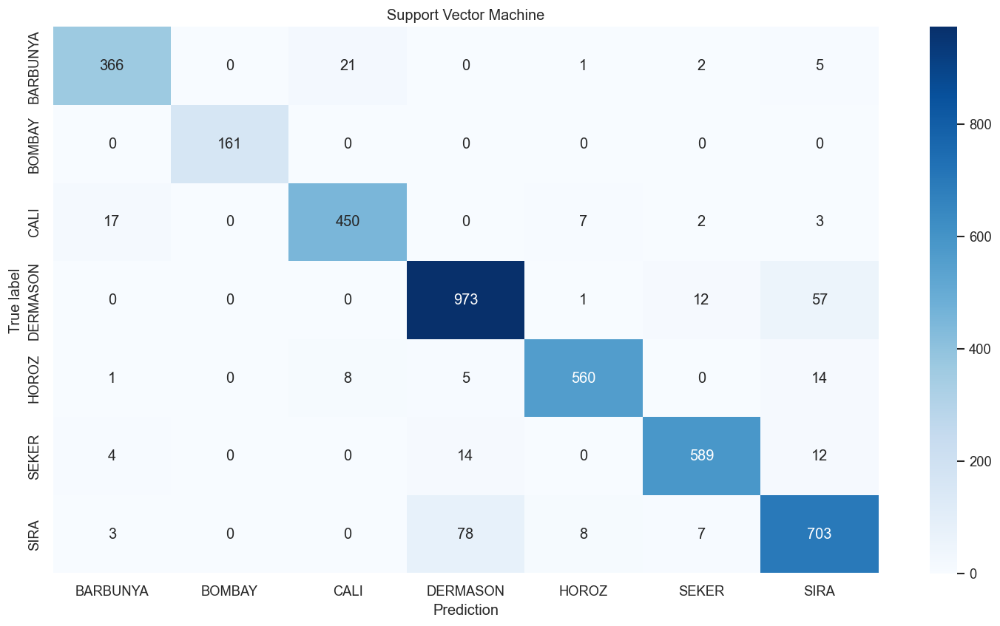

In [95]:
plot_confusion_matrix(svm,X_test,y_test,"Support Vector Machine",is_ml=True)

# Naive Bayes vs Support Vector Machine <a class="anchor" id="14-bullet"></a>

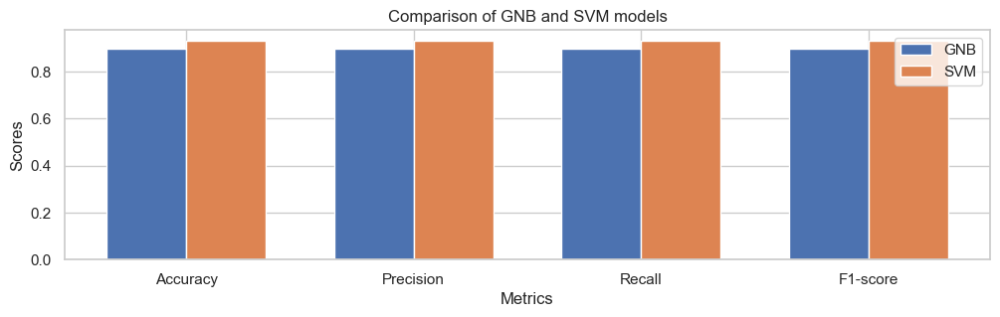

In [96]:
# Create a list of metrics and model names
models = ['GNB', 'SVM']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score']
gnb_values = [gnb_accuracy, gnb_precision, gnb_recall, gnb_f1]
svm_values = [svm_accuracy, svm_precision, svm_recall, svm_f1]

# Creates the figure and axes of the bar chart
fig, ax = plt.subplots(figsize=(12, 3))
index = np.arange(len(metrics))
bar_width = 0.35

# Plots the bars for each model and each metric
rects1 = ax.bar(index, gnb_values, bar_width, label='GNB')
rects2 = ax.bar(index + bar_width, svm_values, bar_width, label='SVM')

# Configure axis labels and title
ax.set_xlabel('Metrics')
ax.set_ylabel('Scores')
ax.set_title('Comparison of GNB and SVM models')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics)
ax.legend()

# Display the graph
plt.show()

# K fold cross validation <a class="anchor" id="15-bullet"></a>

## Naive Bayes <a class="anchor" id="16-bullet"></a>

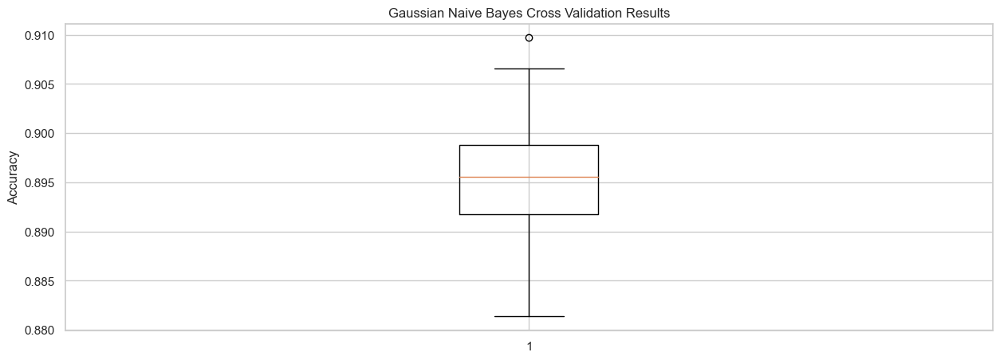

Metrica en Test 0.8986287952987267
Metricas cross_validation [0.88982162 0.9066107  0.89186352 0.89186352 0.89868766 0.88982162
 0.89559286 0.88766404 0.90131234 0.89816273 0.88772298 0.88824764
 0.8992126  0.89448819 0.90393701 0.89664218 0.89139559 0.89711286
 0.9023622  0.88713911 0.89034627 0.89821616 0.89816273 0.89606299
 0.89448819 0.89401889 0.89821616 0.90656168 0.89658793 0.88346457
 0.89192025 0.89506821 0.89133858 0.90026247 0.8992126  0.90136411
 0.90241343 0.88451444 0.88818898 0.89868766 0.88300105 0.90241343
 0.89658793 0.89238845 0.89973753 0.9003148  0.88772298 0.89343832
 0.8992126  0.89186352 0.88772298 0.89559286 0.89868766 0.89816273
 0.89343832 0.89454355 0.88982162 0.89186352 0.89606299 0.90341207
 0.89244491 0.89454355 0.89448819 0.88136483 0.90971129 0.89611752
 0.89611752 0.89816273 0.89186352 0.88923885 0.89821616 0.89506821
 0.88713911 0.89553806 0.9007874  0.89979014 0.89611752 0.88503937
 0.89238845 0.90131234 0.89664218 0.89506821 0.90131234 0.8976378
 0

In [102]:
rkf = RepeatedKFold(n_splits=5, n_repeats=20, random_state=2)

scores_NB = cross_val_score(gnb, X_train, y_train, cv=rkf, scoring="accuracy")

# Box-and-whisker plot of cross-validation results
fig, ax = plt.subplots(figsize=(15, 5))
ax.boxplot(scores_NB)
ax.set_title('Gaussian Naive Bayes Cross Validation Results')
ax.set_ylabel('Accuracy')
plt.show()

# Print metrics
score_pred = metrics.accuracy_score(y_test, y_pred_gnb)
print('Metrica en Test', score_pred)
print('Metricas cross_validation', scores_NB)
print('Media de cross_validation', scores_NB.mean())
print('Standar Deviation de cross_validation', scores_NB.std())



## Support Vector Machine <a class="anchor" id="17-bullet"></a>

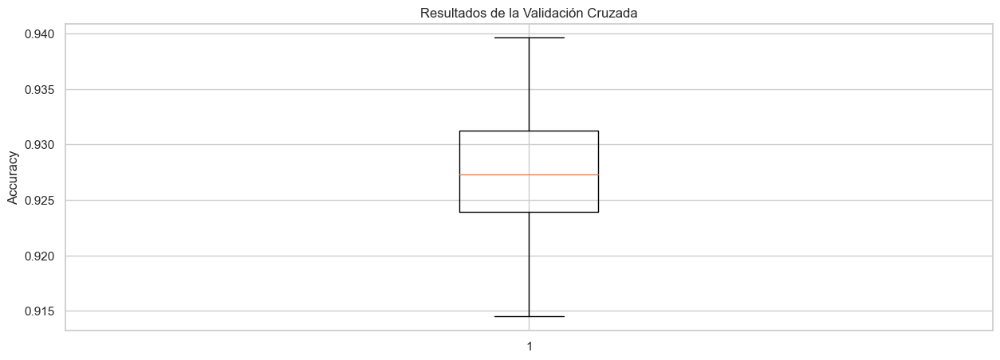

Metrica en Test 0.9309500489715965
Metricas cross_validation [0.93179433 0.92759706 0.92650919 0.92335958 0.93175853 0.92182581
 0.92759706 0.92125984 0.9312336  0.93700787 0.92602308 0.92864638
 0.92335958 0.92230971 0.93858268 0.9270724  0.93336831 0.92545932
 0.93333333 0.92073491 0.92025184 0.92759706 0.93963255 0.92650919
 0.92125984 0.92759706 0.93441763 0.92703412 0.92598425 0.92493438
 0.92497377 0.92497377 0.92860892 0.93018373 0.92440945 0.9296957
 0.93599161 0.91653543 0.92545932 0.92913386 0.91448059 0.93651626
 0.93070866 0.92388451 0.93648294 0.93022036 0.92549843 0.9160105
 0.93805774 0.92913386 0.9270724  0.92392445 0.92598425 0.92493438
 0.92860892 0.93231899 0.92339979 0.92230971 0.92913386 0.9328084
 0.92444911 0.92917104 0.92335958 0.92388451 0.93648294 0.93231899
 0.92182581 0.92860892 0.92178478 0.93175853 0.92339979 0.93389297
 0.91863517 0.92755906 0.93333333 0.93809024 0.92025184 0.92440945
 0.92703412 0.93018373 0.93126967 0.92549843 0.93070866 0.9312336
 0.91

In [413]:
rkf = RepeatedKFold(n_splits=5, n_repeats=20, random_state=2)

scores_SVM = cross_val_score(svm, X_train, y_train, cv=rkf, scoring="accuracy")

# Box-and-whisker plot of cross-validation results
fig, ax = plt.subplots(figsize=(15, 5))
ax.boxplot(scores_SVM)
ax.set_title('Resultados de la Validación Cruzada')
ax.set_ylabel('Accuracy')
plt.show()

# Print metrics
score_pred = metrics.accuracy_score(y_test, y_pred_svm)
print('Metrica en Test', score_pred)
print('Metricas cross_validation', scores_SVM)
print('Media de cross_validation', scores_SVM.mean())
print('Standar Deviation de cross_validation', scores_SVM.std())



## GNB vs SVM <a class="anchor" id="18-bullet"></a>

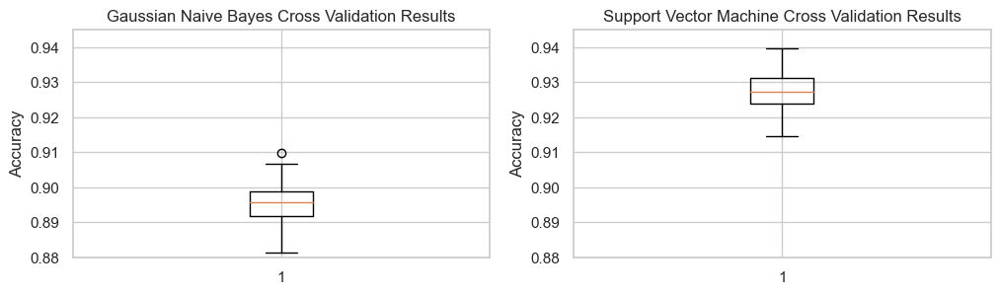

In [411]:
# Box-and-whisker plot of cross-validation results GNB
fig, ax = plt.subplots(ncols=2,figsize=(12, 3))
#ax.boxplot(scores, vert=False)
ax[0].boxplot(scores_NB)
ax[0].set_title('Gaussian Naive Bayes Cross Validation Results')
ax[0].set_ylabel('Accuracy')
ax[0].set_ylim(0.88,0.945)

# Box-and-whisker plot of cross-validation results SVM
ax[1].boxplot(scores_SVM)
ax[1].set_title('Support Vector Machine Cross Validation Results')
ax[1].set_ylabel('Accuracy')
ax[1].set_ylim(0.88,0.945)
plt.show()

By performing a single test set comparison of the two models, the Gaussian Naive Bayes model and the Support Vector
machine model, we obtained very good results, both from 89% accuracy as shown in the figure below.

But once we identified the validations with the k-fold model, we were able to see the following:

The Gaussian model, with an accuracy of 89.86% on the test data without cross validation, gives us a mean cross
validation of 89.5% with a standard deviation of 0.005. The SVM model, with an accuracy of 93.09% on the test data
without cross validation, yields a mean cross validation of 92.75% with a standard deviation of 0.005.
Thus, the NB model obtains an accuracy of 89.86% when the test is run independently, but when iterating over
the test subsets that are generated with k-fold, its prediction metric tends to decrease slightly. In the same way, the
SVM model, obtains an accuracy of 93.09% and when iterating over the test subsets that are generated with k-fold,
its prediction metric decreases slightly to 92.75%.

As a result, despite this slight decrease between the analysis with CV and without CV, both models have good
stability and the results are independent of the test set when solving the dry seed classification problem. The following
figure shows the cross validation results for both models.



# Automatic output of SVM model predictions <a class="anchor" id="19-bullet"></a>

To create an automatic report of the SVM model predictions, we first add an additional column with the predicted values to the main dataframe df_norm, then we cross (using the function df_norm.loc) the main dataframe with the testing dataframe by the row number (ID) and get only the predicted values from the testing data. Finally we create the csv with the ID and predicted Value column.

In [118]:
# Convert the label numbers (0, 1, 2, 3, 4, 5, 6, 7) into their corresponding values (BARBUNYA, BOMBAY, CALI, etc)
y_test_labels = [class_dict[y] for y in y_test]
y_pred_svm_labels = [class_dict[y] for y in y_pred_svm]

# Add the column of predicted values to the main DataFrame
df_norm['predicted value'] = svm.predict(X)

# Select the rows corresponding to the test data
#cross-join the test data with the main dataframe by the column number (ID).
#We previously created the ID column in the main dataframe 
#and added the idx_test variable when creating the training and testing data for the SVM model.
df_results = df_norm.loc[idx_test, ['ID','Class', 'predicted value']]
df_results['predicted value'] = df_results['predicted value'].map(class_dict)

# Save the DataFrame in an CSV file
df_results[['ID','predicted value']].to_csv('results.csv', index=False)

# Conclusions <a class="anchor" id="20-bullet"></a>

Based on the evaluation of the Dry Bean Seeds Classification Model using machine learning algorithms, it can be
concluded that the model is highly effective in detecting dry bean seeds, achieving high accuracy, precision, recall,
and F1-score. The Gaussian Naive Bayes and Support Vector Machine algorithms were both used in the model and
achieved high accuracy, precision, recall, and F1-score (90% and 93% respectively) and both were shown to be stable
and independent of the dataset when performing cross validation tests. However, some misclassifications between
similar classifications, such as SIRA and DERMASON, were observed, which highlights the need for improving data
quality to avoid such errors in future models.

The results demonstrate the potential of the model for real-world applications, such as identifying the origin and
quality of dry bean seeds in the international trade market or improving the breeding and selection of new dry bean
cultivars with desired traits. However, the dataset used for training and evaluation has some limitations, such as a
limited number of cultivars, no information on the age or origin of the seeds and the fact that they are seeds from only
one region. Further improvements in data quality could help avoid misclassifications in the future, including: increasing
the number of BOMBAY seed samples to avoid bias in classification, including parameters to better differentiate SIRA
seeds from DERMASON seeds to avoid mispredictions. In addition, future improvements to tada preprocessing are
proposed, such as: selecting only those features that correlate strongly with each other and discarding features that
do not correlate with others, and oversampling seeds with a small number of samples, such as BOMBAY, to balance
the data.